In [7]:
import csv
import numpy as np
import pandas as pd
# import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LogNorm, Normalize
from matplotlib import colorbar, colors, cm
#import cartopy.io.img_tiles as cimgt
#from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import io
from urllib.request import urlopen, Request
from PIL import Image
import pandas as pd

def SMAPE(v, v_):
    '''
    Symmetric mean absolute percentage error (SMAPE or sMAPE) is an accuracy measure based on percentage (or relative) errors.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :return: int, SMAPE averages on all elements of input.
    '''
    dividend = np.abs(np.array(v) - np.array(v_))
    denominator = np.array(v) + np.array(v_)

    return 2 * np.mean(
        np.divide(dividend, denominator, out=np.zeros_like(dividend), where=denominator != 0, casting='unsafe'))

def RMSE(v, v_):
    '''
    Mean squared error.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :return: int, RMSE averages on all elements of input.
    '''
    return np.sqrt(np.mean((v_ - v) ** 2))


def MAE(v, v_):
    '''
    Mean absolute error.
    :param v: np.ndarray or int, ground truth.
    :param v_: np.ndarray or int, prediction.
    :return: int, MAE averages on all elements of input.
    '''
    return np.mean(np.abs(v_ - v))

In [255]:
def image_spoof(self, tile):  # this function pretends not to be a Python script
    url = self._image_url(tile)  # get the url of the street map API
    req = Request(url)  # start request
    req.add_header('User-agent', 'Anaconda 3')  # add user agent to request
    fh = urlopen(req)
    im_data = io.BytesIO(fh.read())  # get image
    fh.close()  # close url
    img = Image.open(im_data)  # open image with PIL
    img = img.convert(self.desired_tile_form)  # set image format
    return img, self.tileextent(tile), 'lower'  # reformat for cartopy


#######################################
# Formatting the Cartopy plot
#######################################
#
cimgt.Stamen.get_image = image_spoof  # reformat web request for street map spoofing
osm_img = cimgt.Stamen('terrain')  # spoofed, downloaded street map


def plot(lons, lats, values):
    fig = plt.figure(figsize=(12, 9), dpi=300)  # open matplotlib figure
    ax1 = plt.axes(projection=osm_img.crs)  # project using coordinate reference system (CRS) of street map
    # ax1.set_title('Station Map', fontsize=16)
    # extent = [-124.7844079,-66.9513812, 24.7433195, 49.3457868] # Contiguous US bounds
    extent = [-74.19754-0.01, -73.72100999999999+0.01, 40.60135-0.01, 40.90485+0.01]  # NYC bounds
    ax1.set_extent(extent)  # set extents
    ax1.set_xticks(np.linspace(extent[0], extent[1], 7), crs=ccrs.PlateCarree())  # set longitude indicators
    ax1.set_yticks(np.linspace(extent[2], extent[3], 7)[1:], crs=ccrs.PlateCarree())  # set latitude indicators
    lon_formatter = LongitudeFormatter(number_format='0.1f', degree_symbol='', dateline_direction_label=True)  # format lons
    lat_formatter = LatitudeFormatter(number_format='0.1f', degree_symbol='')  # format lats
    ax1.xaxis.set_major_formatter(lon_formatter)  # set lons
    ax1.yaxis.set_major_formatter(lat_formatter)  # set lats
    ax1.xaxis.set_tick_params(labelsize=14)
    ax1.yaxis.set_tick_params(labelsize=14)

    scale = np.ceil(
        -np.sqrt(2) * np.log(np.divide((extent[1] - extent[0]) / 2.0, 350.0)))  # empirical solve for scale based on zoom
    scale = (scale < 20) and scale or 19  # scale cannot be larger than 19
    ax1.add_image(osm_img, int(scale))  # add OSM with zoom specification

    ax1.add_patch(mpatches.Rectangle(xy=[extent[0], extent[2]], width=extent[1]-extent[0], height=extent[3]-extent[2],
                                    facecolor='w',
                                    alpha=0.6,
                                    transform=ccrs.PlateCarree())
                 )

    #######################################
    # Plot the ASOS stations as points
    #######################################
    #
    cmap=cm.get_cmap('OrRd')
#     vmin=2.6 # min(values)
#     vmax=3.7 # max(values)
    
    vmin= min(values)
    vmax= max(values)
    
    the_norm=Normalize(vmin=vmin,vmax=vmax,clip=False)

    sc = ax1.scatter(lons, lats, c=values, transform=ccrs.PlateCarree(),s=5, zorder=2,cmap=cmap,norm=the_norm
             # label='ASOS Station'
             )
    transform = ccrs.PlateCarree()._as_mpl_transform(ax1)  # set transform for annotations

    # # Add Colorbar
    cax,kw = colorbar.make_axes(ax1,location='right',pad=0.1,shrink=0.6)
    cax.tick_params(labelsize=20)
    out=fig.colorbar(sc,cax=cax,**kw)
    out.set_label('°C',size=20)

    plt.show()  # show plot

# Plot each test's result

In [2]:
tests = ['model5', 'model10', 'model15', 'model20', 'model5IoTWU', 'model10IoTWU', 'model15IoTWU', 'model20IoTWU']
output_folder = 'IoT_Weather_Data/output/'+tests[0]+'/'

In [8]:
predictions = np.load(output_folder+'predictions.npy')
observations = np.load(output_folder+'observations.npy')

################################
# parsing the geotab coordinates
################################

stations_df = pd.read_csv(output_folder+'stations.csv', index_col=False)
lons = stations_df.x.values
lats = stations_df.y.values

RMSE_array, MAE_array, bias_array = np.zeros((predictions.shape[0],predictions.shape[1])), \
                                    np.zeros((predictions.shape[0],predictions.shape[1])),\
                                    np.zeros((predictions.shape[0],predictions.shape[1]))


for sid in range(predictions.shape[0]):
    for test_id in range(predictions.shape[1]):
#     for hour_id in range(predictions.shape[2]):
        RMSE_array[sid, test_id] = RMSE(observations[sid, test_id, :], predictions[sid, test_id, :])
        MAE_array[sid, test_id] = MAE(observations[sid, test_id, :], predictions[sid, test_id, :])
        bias_array[sid, test_id] = (predictions[sid, test_id, :] - observations[sid, test_id, :]).mean()

In [258]:
# should first average over days, otherwise the comparison over stations is not fair
# what Manzhu did is to find smallest, mean and maximum RMSE over 27 days for each station
# Then the date of minimum RMSE of one station is not comparable to another station since the date is different
average_error_per_station, min_error_per_station, max_error_per_station, average_mae_per_station, average_bias_per_station = [], [], [], [], []
for sid in range(predictions.shape[0]):
    min_error_per_station.append(RMSE_array[sid,:].min())
    average_error_per_station.append(RMSE_array[sid,:].mean())
    max_error_per_station.append(RMSE_array[sid,:].max())

    average_mae_per_station.append(MAE_array[sid,:].mean())
    average_bias_per_station.append(bias_array[sid,:].mean())
    
print("RMSE min, mean, max: ",min(average_error_per_station), np.mean(average_error_per_station), max(average_error_per_station))
print("MAE min, mean, max: ",min(average_mae_per_station), np.mean(average_mae_per_station), max(average_mae_per_station))
print("bias min, mean, max: ",min(average_bias_per_station), np.mean(average_bias_per_station), max(average_bias_per_station))

RMSE min, mean, max:  2.662094089719984 3.0647274201921255 3.480491938414397
MAE min, mean, max:  2.2381971655068575 2.6177321198844803 2.98938818331118
bias min, mean, max:  0.10800977382395002 0.7762872058331256 1.189064429865943


In [24]:
import math
from statistics import mean
from sklearn.metrics import mean_squared_error
RMSE_x = []
for sid in range(predictions.shape[0]):
    RMSE_x.append(math.sqrt(mean_squared_error(observations[sid], predictions[sid])))

print("RMSE min, mean, max: ",min(RMSE_x), mean(RMSE_x), max(RMSE_x))

RMSE min, mean, max:  3.1697228557845416 3.812514724232904 4.227794305538221


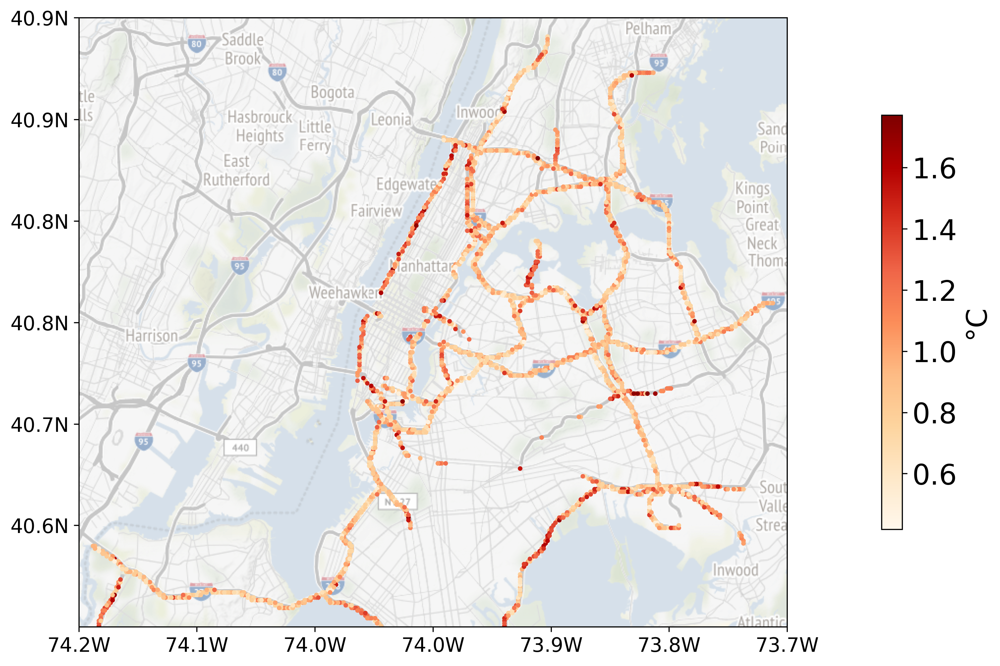

In [259]:
plot(lons, lats, min_error_per_station)

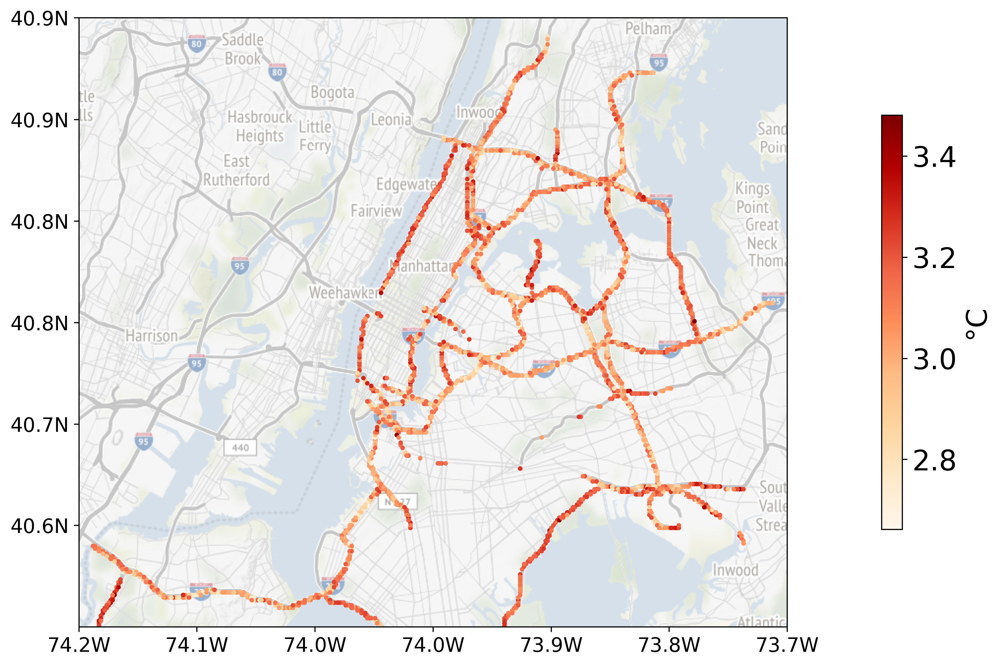

In [260]:
plot(lons, lats, average_error_per_station)

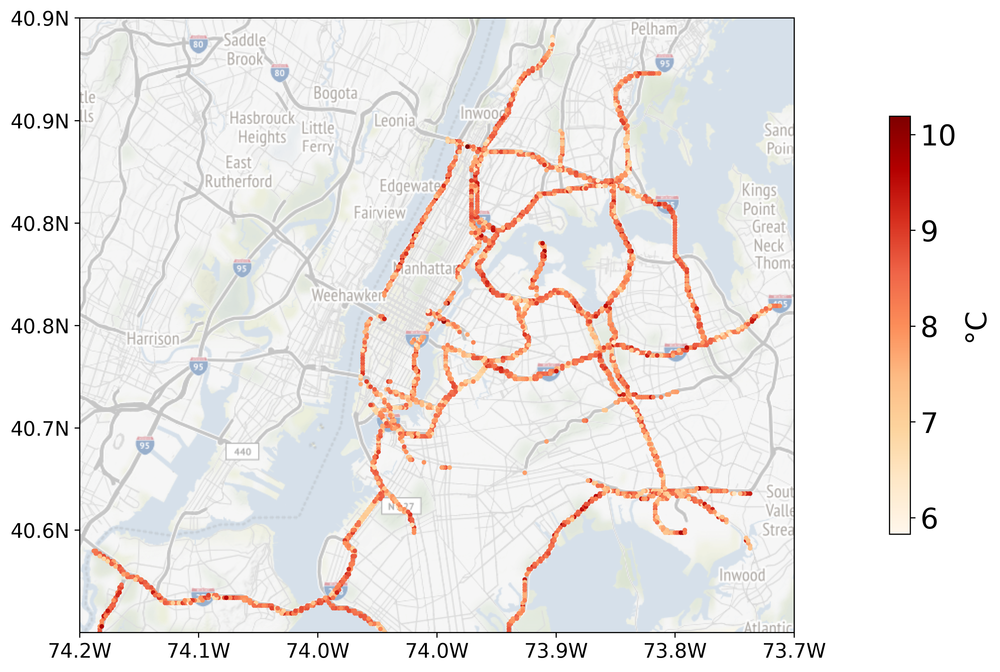

In [261]:
plot(lons, lats, max_error_per_station)